In [2]:
import numpy as np
import numpy.linalg as la
import matplotlib.pyplot as plt
import scipy.ndimage as ndi
from skimage.io import imread, imsave
from skimage.color import rgb2gray
%matplotlib inline 

In [3]:
TL_filename = 'Talbot Laboratory.jpg'
TL_color = imread(TL_filename)

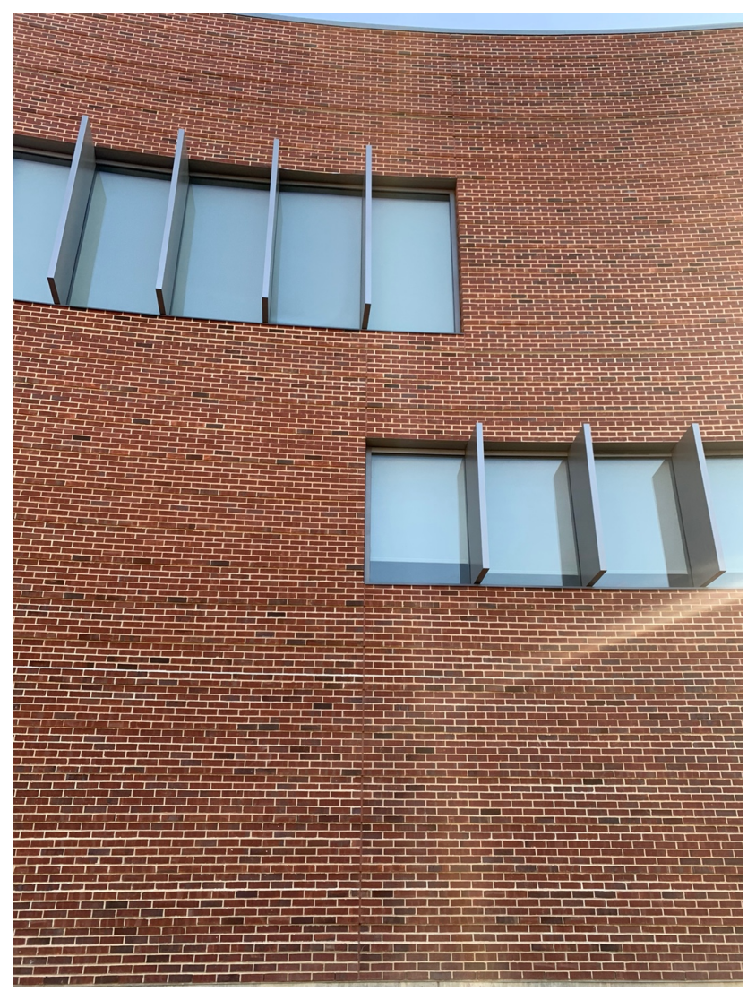

In [4]:
plt.figure(figsize = (10,10))
plt.imshow(TL_color)
_ = plt.axis('off')

In [5]:
TL_gray = rgb2gray(TL_color)

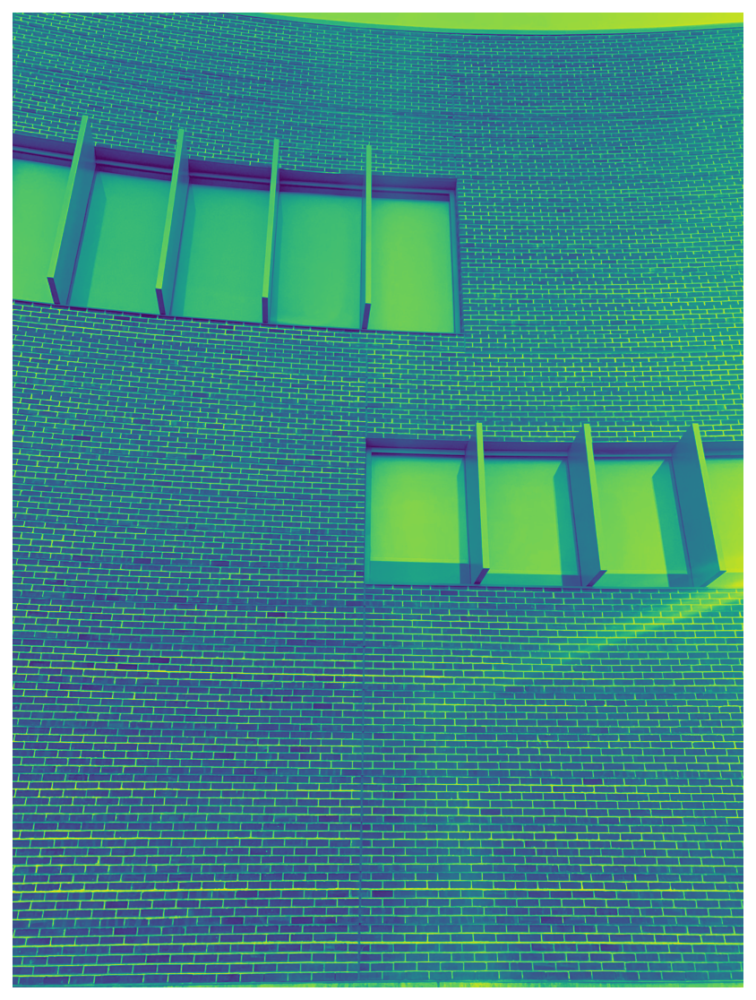

In [6]:
plt.figure(figsize = (10,10))
plt.imshow(TL_gray)
_= plt.axis('off')

In [7]:
def gaussian_kernel(size, sigma = 1):
    size = int(size)//2
    x, y = np.mgrid[-size:size+1, -size:size+1]
    normal = 1/(2.0 *np.pi*sigma**2)
    g = np.exp(-((x**2 + y**2) / (2.0*sigma**2))) * normal
    return g

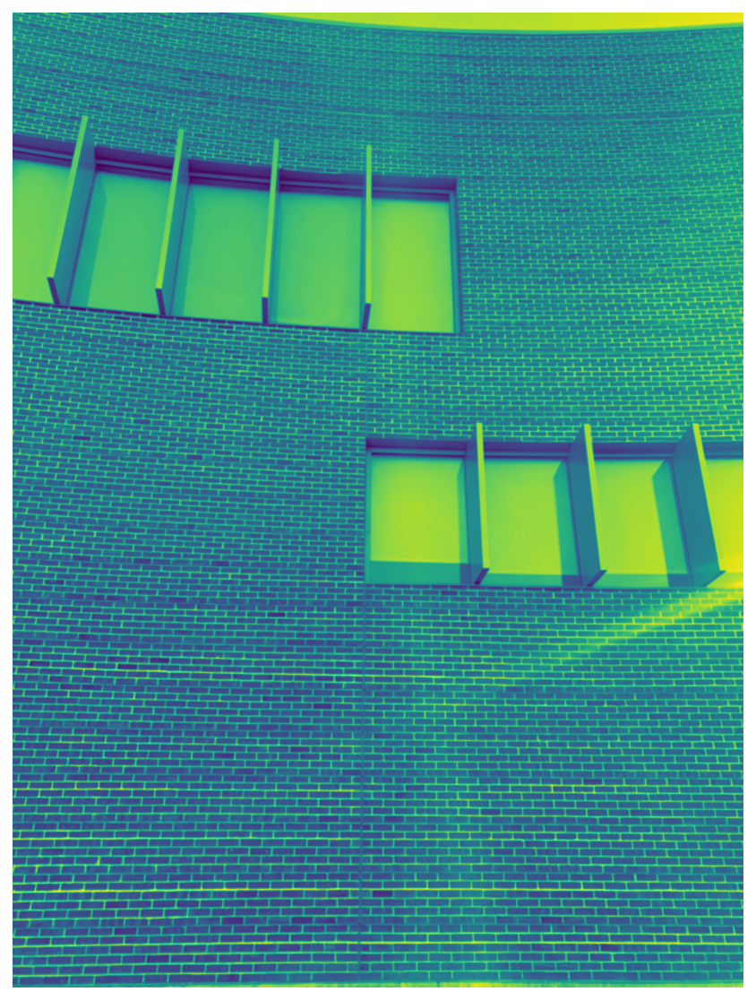

In [8]:
kernel = gaussian_kernel(5)

TL_blur = ndi.convolve(TL_gray, kernel)

plt.figure(figsize = (10,10))
plt.imshow(TL_blur)
_=plt.axis('off')

In [9]:
def sobel_filters(img):
    Kx = np.array([[-1, 0, 1], [-2, 0, 2], [-1, 0, 1]], np.float32)
    Ky = np.array([[1, 2, 1], [0, 0, 0], [-1, -2, -1]], np.float32)
    
    Ix = ndi.convolve(img, Kx)
    Iy = ndi.convolve(img, Ky)
    
    G = np.hypot(Ix, Iy)
    G = G / G.max() * 255
    theta = np.arctan2(Iy, Ix)
    
    return (G, theta)

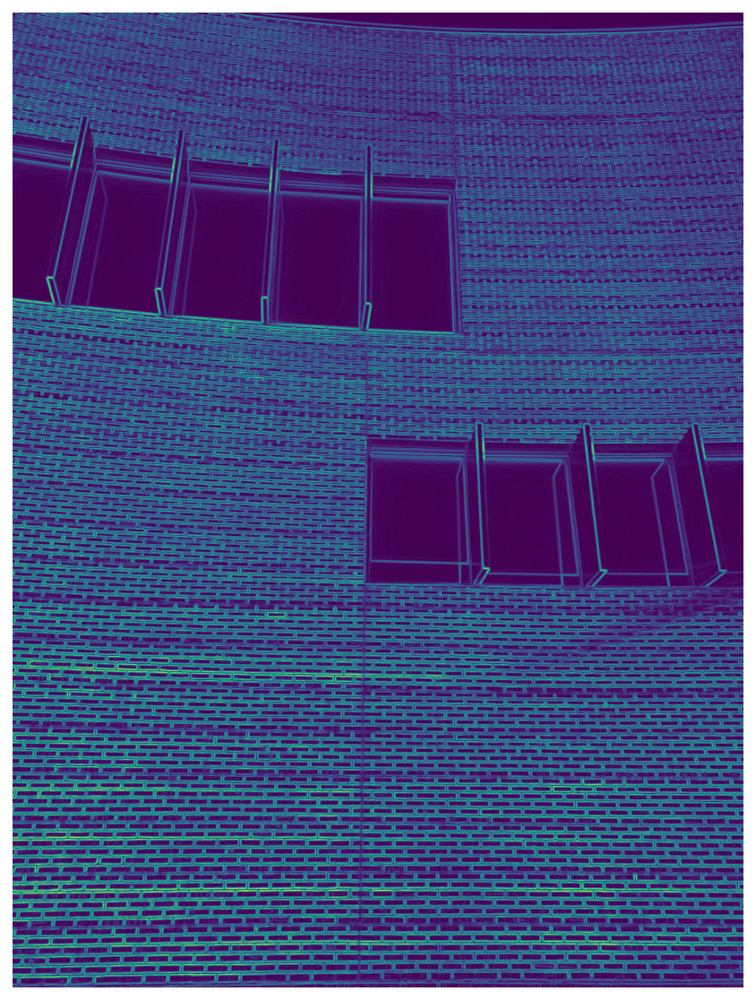

In [10]:
TL_intensity, D = sobel_filters(TL_blur)
plt.figure(figsize = (10,10))
plt.imshow(TL_intensity)
_ = plt.axis('off')

In [11]:
def non_max_suppression(img, D):
    M, N = img.shape
    Z = np.zeros((M,N), dtype=np.int32)
    angle = D * 180. / np.pi
    angle[angle < 0] += 180

    
    for i in range(1,M-1):
        for j in range(1,N-1):
            try:
                q = 255
                r = 255
                
                #angle 0
                if (0 <= angle[i,j] < 22.5) or (157.5 <= angle[i,j] <= 180):
                    q = img[i, j+1]
                    r = img[i, j-1]

                #angle 90
                elif (67.5 <= angle[i,j] < 112.5):
                    q = img[i+1, j]
                    r = img[i-1, j]


                if (img[i,j] >= q) and (img[i,j] >= r):
                    Z[i,j] = img[i,j]
                else:
                    Z[i,j] = 0

            except IndexError as e:
                pass
    
    return Z

In [12]:
TL_nms = non_max_suppression(TL_intensity, D)

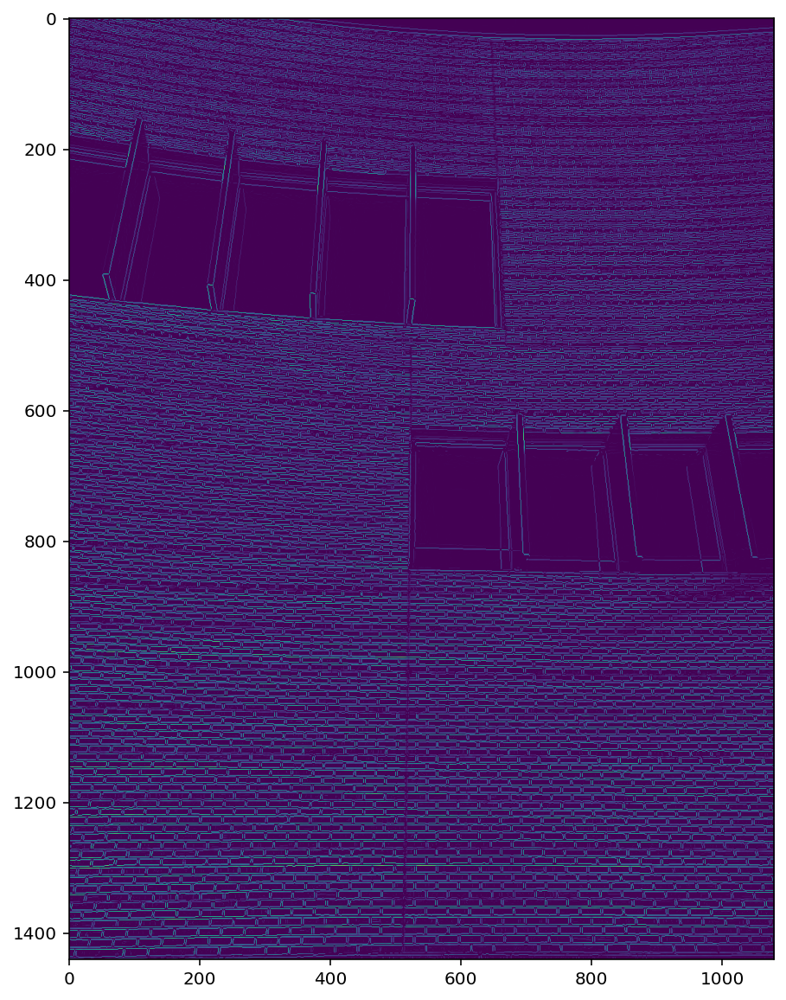

In [13]:
plt.figure(figsize = (10,10))
plt.imshow(TL_nms)
#_ = plt.axis('off')

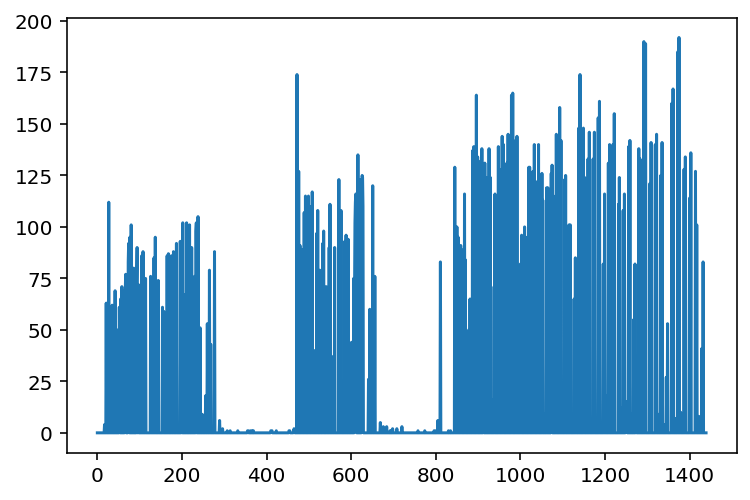

In [14]:
temp = TL_nms[:, 600]
X = np.arange(len(temp))
plt.plot(X, temp)

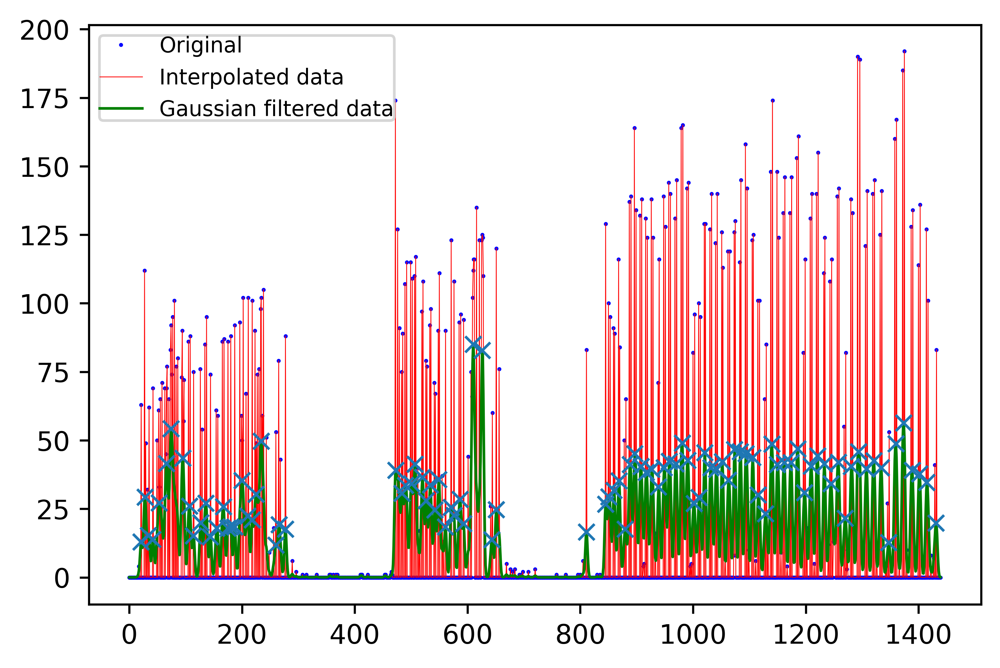

Number of bricks' layers: 99


In [15]:
import matplotlib.pyplot as plt
from scipy import interpolate
from scipy.ndimage import gaussian_filter1d
from scipy.signal import find_peaks

spl = interpolate.UnivariateSpline(X, temp)
n = TL_nms.shape[0]

plt.figure(dpi = 300)
plt.plot(X, temp, 'bo', markersize = 0.5, label = 'Original')
spl.set_smoothing_factor(1)
y = spl(X)
y_smooth = gaussian_filter1d(y, sigma = 2)
peaks, _ = find_peaks(y_smooth, height = np.array([5,100]))
plt.plot(X, spl(X), 'r-', lw=0.3, label = 'Interpolated data')
plt.plot(X, y_smooth, 'g-', lw = 1, label = 'Gaussian filtered data')
plt.plot(peaks, y_smooth[peaks], 'x')
plt.legend(fontsize = 8, borderpad=0.01)
plt.show()

print('''Number of bricks' layers:''', len(peaks))

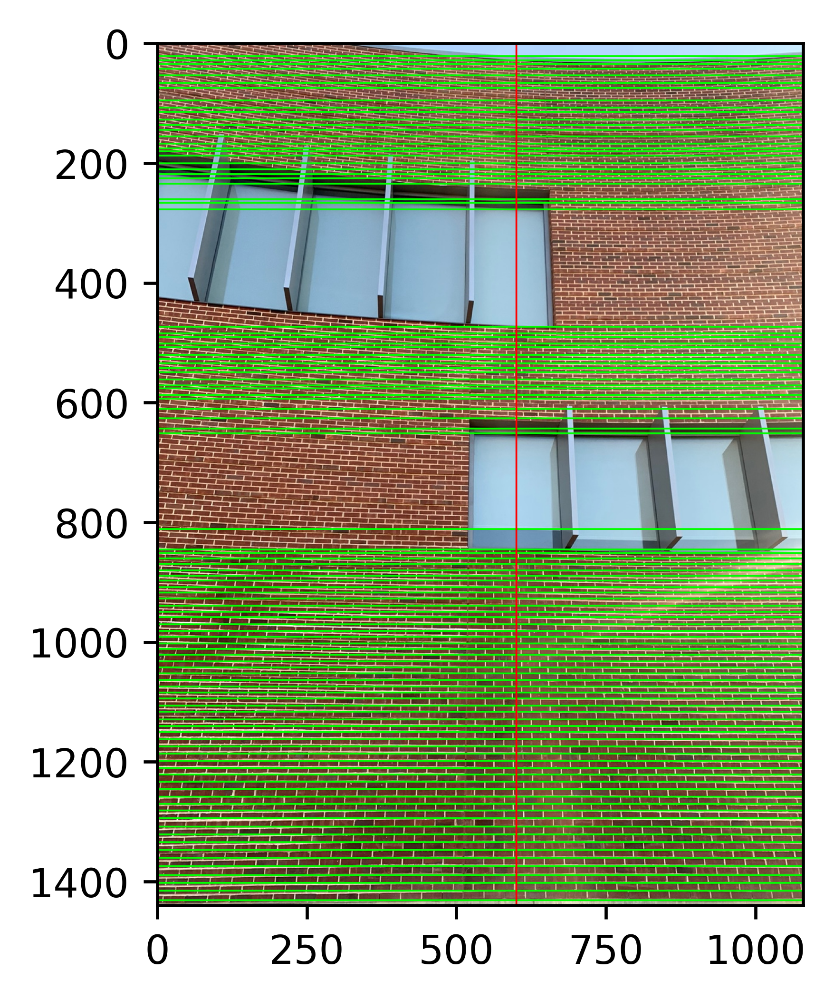

In [17]:
import cv2
x_start = 0
x_end = TL_nms.shape[1]
y_start = 0
y_end = TL_nms.shape[0]

result = TL_color.copy()

for peak in peaks:
    cv2.line(result, (x_start, peak), (x_end, peak), (0, 255, 0), 2)
cv2.line(result, (600, y_start), (600, y_end), (255, 0, 0), 2)

plt.figure(dpi = 300)
plt.imshow(result)